## Importing libaries
---

We'll need the following libraries to develop the models:

In [1]:
import librosa
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scipy

from keras.models import Sequential
from keras.layers import Conv1D, Dense, Dropout, Flatten, MaxPooling1D
from keras.utils import np_utils
from scipy.stats import kurtosis, skew
from sklearn.decomposition import PCA
from sklearn.externals import joblib
from sklearn.ensemble import AdaBoostClassifier, RandomForestClassifier
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier

%matplotlib inline

Using TensorFlow backend.
C:\Anaconda3\lib\site-packages\sklearn\externals\joblib\__init__.py:15: FutureWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=FutureWarning)


## Importing audio files
---

We'll import all the audio files (.wav or .m4a format) in './audio' directory at sampling rate of 44.1kHz:

In [2]:
fileList = librosa.util.find_files('./audio', ext = ['wav', 'm4a'])
digits = [librosa.load(f, sr = 44100) for f in fileList]

In [3]:
digits = pd.DataFrame(digits)
digits.drop(columns = 1, inplace = True)
digits.rename(columns = {0: 'Speech_Raw'}, inplace = True)

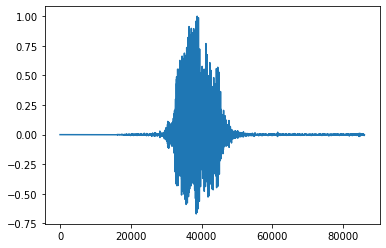

In [4]:
plt.plot((digits.Speech_Raw[0]/max(digits.Speech_Raw[0])))

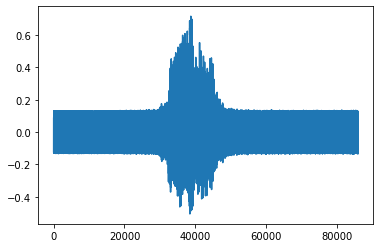

In [5]:
plt.plot((digits.Speech_Raw[10]/max(digits.Speech_Raw[0])))

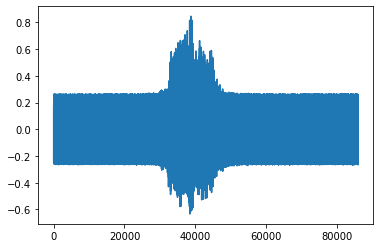

In [6]:
plt.plot((digits.Speech_Raw[20]/max(digits.Speech_Raw[0])))

## Preprocessing and Exploratory Data Analysis
---

We'll begin the preprocessing by downsampling the audio files at 1kHz to remove the noise, and cut the clip into 1 sec segments as well as pad zeros if the recording was cut too early.

Next, we perform feature extraction which includes time domain analysis, frequency domain analysis and speech encoding. The following features are extracted:
- Absolute mean of entire 1sec signal
- Standard deviation
- Skewness
- Kurtosis
- RMS energy value
- Spectral Flatness
- Zero Crossing Rate
- Centroid
- 13 Mel Frequency Cepstral Coefficients (MFCC) for speech spectral range
- 12 Linear Predictive Coding (LPC) coefficients

Last but not least, we will do EDA by analyzing the downsampled 1kHz 1sec audios as well as the LPC reconstruction plots. AWGN effects were observed to be reduced through the preprocessing stage.

In [7]:
def Resample_1kHz(x):
    return np.array(librosa.resample(x, orig_sr = 44100, target_sr = 1000))
def Cut_1sec(x):
    peak = librosa.util.peak_pick(x, 1000, 1000, 1000, 1000, 0, 1000)
    cut = x[(peak[0] - 500):(peak[0] + 500)]
    pad = librosa.util.pad_center(cut, 1000)
    return pad

digits['Speech_1kHz'] = digits['Speech_Raw'].apply(Resample_1kHz)
digits['Speech_1sec'] = digits['Speech_1kHz'].apply(Cut_1sec)

In [8]:
def AbsMean(x):
    out = np.abs(x)
    return out.mean()
def SD(x):
    return x.std()
def Skewness(x):
    return skew(x)
def Kurtosis(x):
    return kurtosis(x, fisher = True)
def RMS(x):
    data = librosa.feature.rms(x, frame_length = 1000, hop_length = 1001)
    return data[0][0]
def Flat(x):
    data = librosa.feature.spectral_flatness(x, hop_length = 1001)
    return data[0][0]
def ZCR(x):
    data = librosa.feature.zero_crossing_rate(x, frame_length = 1000, hop_length = 1001)
    return data[0][0]
def Centroid(x):
    data = librosa.feature.spectral_centroid(x, sr = 1000, hop_length = 1001)
    return data[0][0]

digits['AbsMean'] = digits['Speech_1sec'].apply(AbsMean)
digits['SD'] = digits['Speech_1sec'].apply(SD)
digits['Skewness'] = digits['Speech_1sec'].apply(Skewness)
digits['Kurtosis'] = digits['Speech_1sec'].apply(Kurtosis)
digits['RMS'] = digits['Speech_1sec'].apply(RMS)
digits['Flat'] = digits['Speech_1sec'].apply(Flat)
digits['ZCR'] = digits['Speech_1sec'].apply(ZCR)
digits['Centroid'] = digits['Speech_1sec'].apply(Centroid)

In [9]:
def MFCC1(x):
    data = librosa.feature.mfcc(x, sr = 1000, n_mfcc = 13)
    return data[0].mean()
def MFCC2(x):
    data = librosa.feature.mfcc(x, sr = 1000, n_mfcc = 13)
    return data[1].mean()
def MFCC3(x):
    data = librosa.feature.mfcc(x, sr = 1000, n_mfcc = 13)
    return data[2].mean()
def MFCC4(x):
    data = librosa.feature.mfcc(x, sr = 1000, n_mfcc = 13)
    return data[3].mean()
def MFCC5(x):
    data = librosa.feature.mfcc(x, sr = 1000, n_mfcc = 13)
    return data[4].mean()
def MFCC6(x):
    data = librosa.feature.mfcc(x, sr = 1000, n_mfcc = 13)
    return data[5].mean()
def MFCC7(x):
    data = librosa.feature.mfcc(x, sr = 1000, n_mfcc = 13)
    return data[6].mean()
def MFCC8(x):
    data = librosa.feature.mfcc(x, sr = 1000, n_mfcc = 13)
    return data[7].mean()
def MFCC9(x):
    data = librosa.feature.mfcc(x, sr = 1000, n_mfcc = 13)
    return data[8].mean()
def MFCC10(x):
    data = librosa.feature.mfcc(x, sr = 1000, n_mfcc = 13)
    return data[9].mean()
def MFCC11(x):
    data = librosa.feature.mfcc(x, sr = 1000, n_mfcc = 13)
    return data[10].mean()
def MFCC12(x):
    data = librosa.feature.mfcc(x, sr = 1000, n_mfcc = 13)
    return data[11].mean()
def MFCC13(x):
    data = librosa.feature.mfcc(x, sr = 1000, n_mfcc = 13)
    return data[12].mean()

digits['MFCC1'] = digits['Speech_1sec'].apply(MFCC1)
digits['MFCC2'] = digits['Speech_1sec'].apply(MFCC2)
digits['MFCC3'] = digits['Speech_1sec'].apply(MFCC3)
digits['MFCC4'] = digits['Speech_1sec'].apply(MFCC4)
digits['MFCC5'] = digits['Speech_1sec'].apply(MFCC5)
digits['MFCC6'] = digits['Speech_1sec'].apply(MFCC6)
digits['MFCC7'] = digits['Speech_1sec'].apply(MFCC7)
digits['MFCC8'] = digits['Speech_1sec'].apply(MFCC8)
digits['MFCC9'] = digits['Speech_1sec'].apply(MFCC9)
digits['MFCC10'] = digits['Speech_1sec'].apply(MFCC10)
digits['MFCC11'] = digits['Speech_1sec'].apply(MFCC11)
digits['MFCC12'] = digits['Speech_1sec'].apply(MFCC12)
digits['MFCC13'] = digits['Speech_1sec'].apply(MFCC13)

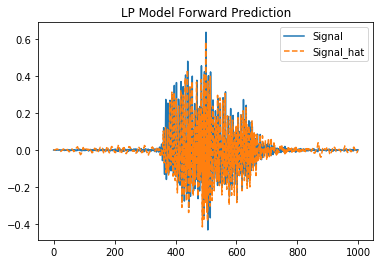

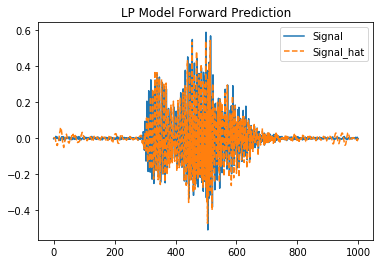

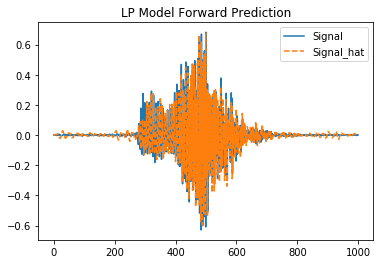

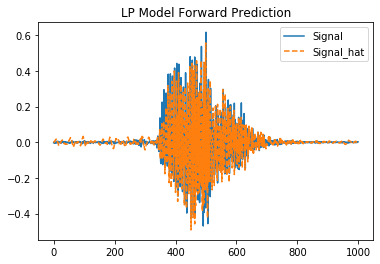

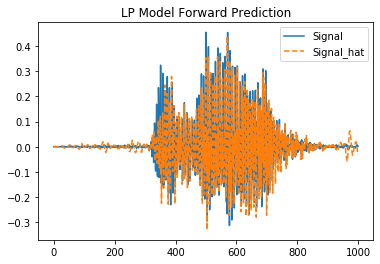

...

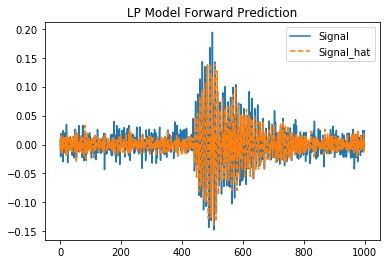

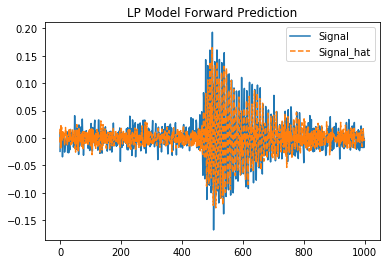

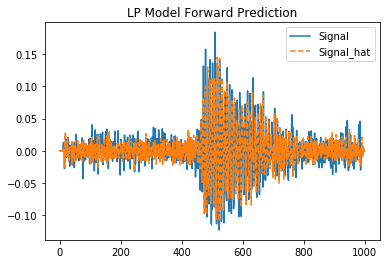

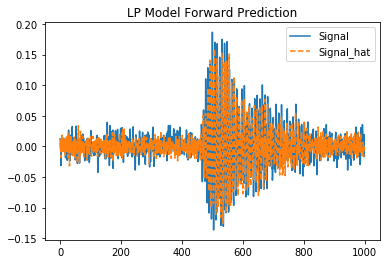

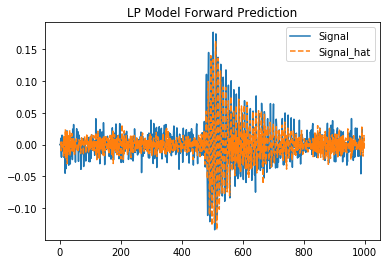

In [10]:
def LPC1(x):
    LPC = librosa.core.lpc(x, 12)
    x_hat = scipy.signal.lfilter([0] + -1*LPC[1:], [1], x)
    plt.figure()
    plt.plot(x)
    plt.plot(x_hat, linestyle='--')
    plt.legend(['Signal', 'Signal_hat'])
    plt.title('LP Model Forward Prediction')
    plt.show()
    return LPC[1]
def LPC2(x):
    LPC = librosa.core.lpc(x, 12)
    return LPC[2]
def LPC3(x):
    LPC = librosa.core.lpc(x, 12)
    return LPC[3]
def LPC4(x):
    LPC = librosa.core.lpc(x, 12)
    return LPC[4]
def LPC5(x):
    LPC = librosa.core.lpc(x, 12)
    return LPC[5]
def LPC6(x):
    LPC = librosa.core.lpc(x, 12)
    return LPC[6]
def LPC7(x):
    LPC = librosa.core.lpc(x, 12)
    return LPC[7]
def LPC8(x):
    LPC = librosa.core.lpc(x, 12)
    return LPC[8]
def LPC9(x):
    LPC = librosa.core.lpc(x, 12)
    return LPC[9]
def LPC10(x):
    LPC = librosa.core.lpc(x, 12)
    return LPC[10]
def LPC11(x):
    LPC = librosa.core.lpc(x, 12)
    return LPC[11]
def LPC12(x):
    LPC = librosa.core.lpc(x, 12)
    return LPC[12]

digits['LPC1'] = digits['Speech_1sec'].apply(LPC1)
digits['LPC2'] = digits['Speech_1sec'].apply(LPC2)
digits['LPC3'] = digits['Speech_1sec'].apply(LPC3)
digits['LPC4'] = digits['Speech_1sec'].apply(LPC4)
digits['LPC5'] = digits['Speech_1sec'].apply(LPC5)
digits['LPC6'] = digits['Speech_1sec'].apply(LPC6)
digits['LPC7'] = digits['Speech_1sec'].apply(LPC7)
digits['LPC8'] = digits['Speech_1sec'].apply(LPC8)
digits['LPC9'] = digits['Speech_1sec'].apply(LPC9)
digits['LPC10'] = digits['Speech_1sec'].apply(LPC10)
digits['LPC11'] = digits['Speech_1sec'].apply(LPC11)
digits['LPC12'] = digits['Speech_1sec'].apply(LPC12)

In [11]:
digits.head()

,Speech_Raw,Speech_1kHz,Speech_1sec,AbsMean,SD,Skewness,Kurtosis,RMS,Flat,ZCR,...,LPC3,LPC4,LPC5,LPC6,LPC7,LPC8,LPC9,LPC10,LPC11,LPC12
0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.00031280264, -0.000583567, -0.000655781, 0....",0.045040,0.094939,1.064645,7.932706,0.101667,0.014538,0.205,...,0.764283,1.998012,1.164337,2.302475,0.920783,1.393997,0.428713,0.977009,0.280023,0.323724
1,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[-0.0025151756, -0.0014766941, 0.001532333, 0....",0.050656,0.102190,0.941351,6.933003,0.114399,0.015175,0.200,...,0.640416,1.806641,0.740313,1.813742,0.421889,0.940289,0.198626,0.637538,-0.064264,0.064078
2,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0003684032, -0.00021248595, -0.0012112064, ...",0.055593,0.120275,0.399033,9.060426,0.148419,0.009076,0.221,...,0.735114,1.729505,0.998659,1.805967,0.553752,0.923318,0.200420,0.640215,0.020230,0.120270
3,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[-0.0023986294, 0.0014400391, -0.00015377477, ...",0.046853,0.102863,0.692546,8.230625,0.125970,0.014887,0.224,...,0.672376,1.690042,1.009942,1.939549,0.612096,1.048490,0.281187,0.760792,0.198007,0.279941
4,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.00012589483, 0.00020172296, -0.00069656793,...",0.048836,0.090376,1.008358,4.831956,0.066123,0.016036,0.189,...,0.773523,1.850660,1.092647,1.923694,1.022697,1.076965,0.453674,0.748575,0.304383,0.134946


## Machine Learning Modeling
---

In the next section, we will build the machine learning model. The process involve the following:
- Train-Test Split
- Scaling
- Principal Component Analysis
- Model Training & Cross Validaion
- Model Selection, Fitting & Evaluation
- Misclassification Analysis

In [12]:
features = ['AbsMean', 'SD', 'Skewness', 'Kurtosis', 'RMS', 'Flat', 'ZCR', 'Centroid', 'LPC1', 'LPC2',
            'LPC3', 'LPC4', 'LPC5', 'LPC6', 'LPC7', 'LPC8', 'LPC9', 'LPC10', 'LPC11', 'LPC12',
            'MFCC1', 'MFCC2', 'MFCC3', 'MFCC4', 'MFCC5', 'MFCC6', 'MFCC7', 'MFCC8', 'MFCC9', 'MFCC10',
            'MFCC11', 'MFCC12', 'MFCC13']

In [13]:
digits['Text'] = 0
digits.loc[30:60,'Text'] = 1
digits.loc[60:90,'Text'] = 2
digits.loc[90:120,'Text'] = 3
digits.loc[120:150,'Text'] = 4
digits.loc[150:180,'Text'] = 5
digits.loc[180:210,'Text'] = 6
digits.loc[210:240,'Text'] = 7
digits.loc[240:270,'Text'] = 8
digits.loc[270:300,'Text'] = 9

In [14]:
baseline = digits['Text'].value_counts()
print(baseline)
baseline = digits['Text'].value_counts(normalize = True)
print(baseline)

9    30
8    30
7    30
6    30
5    30
4    30
3    30
2    30
1    30
0    30
Name: Text, dtype: int64
9    0.1
8    0.1
7    0.1
6    0.1
5    0.1
4    0.1
3    0.1
2    0.1
1    0.1
0    0.1
Name: Text, dtype: float64


In [15]:
#Train-Test Split
X_train, X_test, y_train, y_test = train_test_split(digits[features],
                                                    digits['Text'],
                                                    stratify = digits['Text'],
                                                    random_state = 42, shuffle = True)

In [16]:
#Scaling
ss = StandardScaler()
X_train_sc = ss.fit_transform(X_train)
X_test_sc = ss.transform(X_test)

In [17]:
#PCA
pca = PCA()
pca.fit(X_train_sc)
Z_train = pca.transform(X_train_sc)
Z_test = pca.transform(X_test_sc)
pca = PCA(n_components = 30)
pca.fit(X_train_sc)
Z_train = pca.transform(X_train_sc)
Z_test = pca.transform(X_test_sc)

In [18]:
#Cross Valiations
ada = AdaBoostClassifier(base_estimator = DecisionTreeClassifier())
ada_params = {
    'n_estimators': [25, 50, 100],
    'base_estimator__max_depth': [None, 1, 2],
    'learning_rate': [.8, .9, 1.]
}
gs = GridSearchCV(ada,param_grid = ada_params, cv = 3, verbose = 1)
gs.fit(Z_train, y_train)
print(gs.best_score_)
gs.best_params_

Fitting 3 folds for each of 27 candidates, totalling 81 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  81 out of  81 | elapsed:    7.9s finished


0.7244444444444444


{'base_estimator__max_depth': 2, 'learning_rate': 0.8, 'n_estimators': 100}

In [19]:
rfc = RandomForestClassifier()
rfc_params = {
    'n_estimators': [100, 150, 200],
    'max_depth': [None, 1, 2, 3, 4, 5],
}
gs = GridSearchCV(rfc, param_grid = rfc_params, cv = 3, verbose = 1)
gs.fit(Z_train, y_train)
print(gs.best_score_)
gs.best_params_

Fitting 3 folds for each of 18 candidates, totalling 54 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  54 out of  54 | elapsed:   11.5s finished


0.8977777777777778


{'max_depth': None, 'n_estimators': 150}

In [20]:
ada = AdaBoostClassifier(base_estimator = DecisionTreeClassifier(max_depth = 2),n_estimators = 100, learning_rate = 0.8)
model = ada.fit(Z_train, y_train)
print('Training Score: ', model.score(Z_train, y_train))
print('Test Score: ', model.score(Z_test, y_test))

Training Score:  0.9911111111111112
Test Score:  0.7733333333333333


In [21]:
rfc = RandomForestClassifier(max_depth = None, n_estimators = 150)
model = rfc.fit(Z_train, y_train)
print('Training Score: ', model.score(Z_train, y_train))
print('Test Score: ', model.score(Z_test, y_test))

Training Score:  1.0
Test Score:  0.9466666666666667


In [22]:
#Misclassification anaylsis
pred = rfc.predict(Z_test)
miss = []
for i, (index, p, actual) in enumerate(zip(y_test.index, pred, y_test.values)):
    if p != actual:
        miss.append([index, i])
print(miss)
for i in miss:
    print('Actual: ', y_test[i[0]], ', Predict: ', pred[i[1]])

[[261, 1], [118, 26], [142, 44], [240, 60]]
Actual:  8 , Predict:  6
Actual:  3 , Predict:  2
Actual:  4 , Predict:  2
Actual:  8 , Predict:  6


## Deep Learning Modeling
---

In the next section, we will build the deep learning model using the Covolutional Neural Network (CNN). The process involve the following:
- Convert audio samples from 2D array to 3D array
- Encode the ground truth
- Train-Test Split
- Model Training & Fitting
- Model Evaluation
- Misclassification Analysis

In [23]:
# convert audio samples from 2D array to 3D
X =[]
for i in range(0,digits.shape[0]):
    X.append(digits.Speech_1sec[i].reshape(1000,1))

In [24]:
#Encode y
y = np.zeros(300,dtype=int)
y[30:60] = 1
y[60:90] = 2
y[90:120] = 3
y[120:150] = 4
y[150:180] = 5
y[180:210] = 6
y[210:240] = 7
y[240:270] = 8
y[270:300] = 9

In [25]:
#Train-Test Split
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify = y, random_state = 42, shuffle = True)

In [26]:
X_train = np.array(X_train).reshape(-1, 1000, 1)
X_test = np.array(X_test).reshape(-1, 1000, 1)
y_train = np_utils.to_categorical(y_train, num_classes = 10)
y_test = np_utils.to_categorical(y_test, num_classes = 10)

In [27]:
cnn = Sequential()
cnn.add(Conv1D(8, 13, padding = 'valid', activation = 'relu', strides = 1, input_shape=(1000,1)))
cnn.add(MaxPooling1D(pool_size = (3)))
cnn.add(Dropout(0.3))
cnn.add(Conv1D(16, 11, padding = 'valid', activation = 'relu', strides = 1))
cnn.add(MaxPooling1D(pool_size = (3)))
cnn.add(Dropout(0.3))
cnn.add(Conv1D(32, 9, padding = 'valid', activation = 'relu', strides = 1))
cnn.add(MaxPooling1D(pool_size = (3)))
cnn.add(Dropout(0.3))
cnn.add(Conv1D(64, 7, padding = 'valid', activation = 'relu', strides = 1))
cnn.add(MaxPooling1D(pool_size = (3)))
cnn.add(Dropout(0.3))
cnn.add(Flatten())
cnn.add(Dense(256, activation = 'relu'))
cnn.add(Dropout(0.3))
cnn.add(Dense(128, activation = 'relu'))
cnn.add(Dropout(0.3))
cnn.add(Dense(10, activation = 'softmax'))
cnn.compile(loss = 'categorical_crossentropy',
              optimizer = 'adam',
              metrics = ['accuracy'])
cnn.summary()
#https://www.analyticsvidhya.com/blog/2019/07/learn-build-first-speech-to-text-model-python/

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 988, 8)            112       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 329, 8)            0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 329, 8)            0         
_________________________________________________________________
conv1d_2 (Conv1D)            (None, 319, 16)           1424      
_________________________________________________________________
max_pooling1d_2 (MaxPooling1 (None, 106, 16)           0         
_________________________________________________________________
dropout_2 (Dropout)          (None, 106, 16)           0         
_________________________________________________________________
conv1d_3 (Conv1D)            (None, 98, 32)           

In [28]:
#Model training & fitting
cnn.fit(X_train, y_train,
                    batch_size = 64,
                    validation_data = (X_test, y_test),
                    epochs = 100, verbose = 1)

Train on 225 samples, validate on 75 samples
Epoch 1/100
225/225 [==============================] - 1s 4ms/step - loss: 2.2942 - accuracy: 0.1511 - val_loss: 2.2898 - val_accuracy: 0.3067
Epoch 2/100
225/225 [==============================] - 0s 1ms/step - loss: 2.2638 - accuracy: 0.1600 - val_loss: 2.2660 - val_accuracy: 0.2000
Epoch 3/100
225/225 [==============================] - 0s 1ms/step - loss: 2.2136 - accuracy: 0.1867 - val_loss: 2.2196 - val_accuracy: 0.1467
Epoch 4/100
225/225 [==============================] - 0s 1ms/step - loss: 2.1624 - accuracy: 0.1733 - val_loss: 2.1498 - val_accuracy: 0.2133
Epoch 5/100
225/225 [==============================] - 0s 1ms/step - loss: 2.0596 - accuracy: 0.2178 - val_loss: 2.0622 - val_accuracy: 0.2800
Epoch 6/100
225/225 [==============================] - 0s 1ms/step - loss: 1.9500 - accuracy: 0.2844 - val_loss: 1.9609 - val_accuracy: 0.2667
Epoch 7/100
225/225 [==============================] - 0s 1ms/step - loss: 1.8680 - accuracy: 0.2

In [30]:
#Model Evluation
cnn_score = cnn.evaluate(X_test, y_test, verbose = 1)
cnn_labels = cnn.metrics_names
print(f'Model {cnn_labels[0]}  : {cnn_score[0]}')
print(f'Model {cnn_labels[1]}   : {cnn_score[1]}')

75/75 [==============================] - 0s 439us/step
Model loss  : 0.1764904401699702
Model accuracy   : 0.9333333373069763


In [31]:
pred = cnn.predict_classes(X_test)
y_test = [list(i).index(1) for i in y_test]

In [32]:
for i, (actual, pred) in enumerate (zip(y_test, pred)):
    if actual != pred:
        print('Actual: ', actual, 'Predcited: ', pred)

Actual:  3 Predcited:  2
Actual:  4 Predcited:  1
Actual:  1 Predcited:  9
Actual:  3 Predcited:  2
Actual:  4 Predcited:  1


## Export Model
---

The Deep Learning Model seems to perform better than the Machine Learning Models. Nevertheless, we will export both RFC and CNN models for AWS deployment.

In [33]:
joblib.dump(ss, 'ss.pkl')

['ss.pkl']

In [34]:
joblib.dump(pca, 'pca.pkl')

['pca.pkl']

In [35]:
joblib.dump(model, 'rfc.pkl')

['rfc.pkl']

In [36]:
joblib.dump(cnn, 'cnn.pkl')

['cnn.pkl']